# Projeto de Visão Computacional

## Tarefas de Manipulação

### Tarefa 1 - Visualização de Imagens

Observação: os códigos referentes ao OpenCV e PIL abrem uma nova janela para a visualização da imagem

Com OpenCV

In [1]:
import cv2

In [2]:
vader = cv2.imread("Imagens/DarthVader.jpg")
cv2.imshow('Darth Vader', vader)

cv2.waitKey(0) # waits until a key is pressed
cv2.destroyAllWindows() # destroys the window showing image

Com Pillow

In [3]:
from PIL import Image

In [4]:
yoda = Image.open("Imagens/Yoda.jpg")
yoda.show()

Com Matplotlib

In [5]:
import matplotlib.pyplot as plt

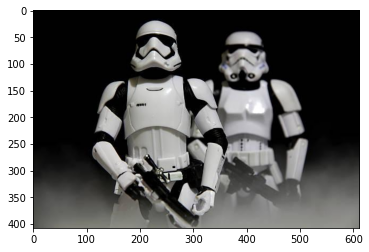

In [6]:
trooper = plt.imread("Imagens/Stormtrooper.jpg")
plt.imshow(trooper)
plt.show()

No primeiro caso, é possível utilizar uma funcionalidade da biblioteca Pillow para visualizar a imagem no próprio notebook.

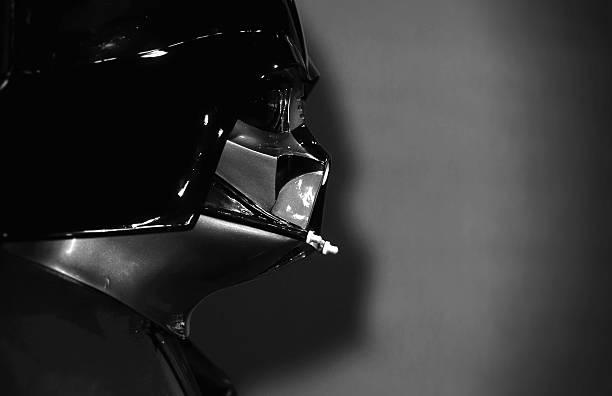

In [7]:
Image.fromarray(vader)

### Tarefa 2 - Colorspaces

Para esta tarefa foi utilizada uma outra imagem e a biblioteca OpenCV: 

In [8]:
colorful = cv2.imread("Imagens/YodaColorido.jpg")
cv2.imshow('Yoda com cores', colorful)

cv2.waitKey(0) # waits until a key is pressed
cv2.destroyAllWindows() # destroys the window showing image

Assim como mostrado anteriormente, pode-se visualizar a imagem no próprio notebook: 

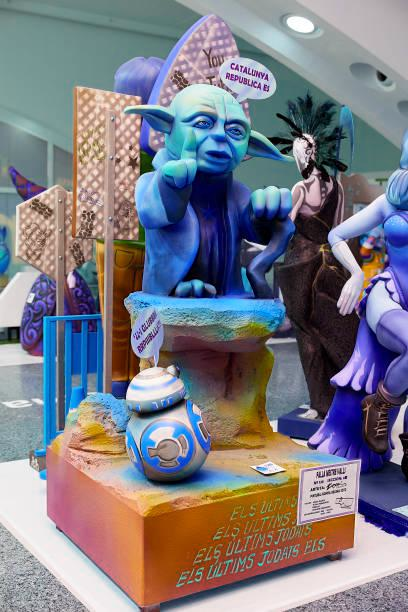

In [9]:
Image.fromarray(colorful)

Uma observação a ser feita é que as cores da imagem mostrada no notebook é diferente daquela mostrada na nova janela para visualização da imagem (o Yoda está com uma cara azulada!!). Isso será explicado mais à frente! 

Sabe-se que uma imagem é composta por um array contendo 3 matrizes, correspondentes às 3 cores (azul, verde e vermelho). 
Outra informação relevante é que o valor de cada posição da matriz corresponde a um pixel da imagem, dessa forma, cada pixel possui um nível de azul, verde e vermelho, o que resulta numa imagem colorida aos nossos olhos.

In [10]:
colorful

array([[[106, 129, 125],
        [103, 126, 122],
        [102, 125, 121],
        ...,
        [159, 150, 160],
        [158, 149, 159],
        [158, 149, 159]],

       [[108, 131, 127],
        [106, 129, 125],
        [104, 127, 123],
        ...,
        [159, 150, 160],
        [158, 149, 159],
        [158, 149, 159]],

       [[109, 132, 128],
        [107, 130, 126],
        [106, 129, 125],
        ...,
        [160, 151, 161],
        [159, 150, 160],
        [159, 150, 160]],

       ...,

       [[130, 129, 131],
        [129, 128, 130],
        [169, 168, 170],
        ...,
        [100,  88, 106],
        [141, 129, 147],
        [150, 138, 156]],

       [[126, 125, 127],
        [134, 133, 135],
        [156, 155, 157],
        ...,
        [103,  91, 109],
        [145, 133, 151],
        [146, 134, 152]],

       [[140, 139, 141],
        [146, 145, 147],
        [137, 136, 138],
        ...,
        [102,  90, 108],
        [134, 122, 140],
        [ 93,  81,  99]]

Além disso, é possível utilizar numpy para transformar essa imagem colorida em "preto e branco", isto é, em tons de cinza.

In [11]:
import numpy as np 
import cv2

# pega os valores de altura, comprimento e número de matrizes da imagem
height, width, channel = colorful.shape

# Cria a imagem/matriz composta de zeros
not_colorful = np.zeros((height,width,1))

# Cálculos para numpy
for i in np.arange(height):
    for j in np.arange(width):
        r = colorful.item(i,j,0)
        g = colorful.item(i,j,1)
        b = colorful.item(i,j,2)

        # RGB para Grayscale
        y = 0.299*r + 0.587*g + 0.144*b

        not_colorful.itemset((i,j,0),int(y))

# Visualização da imagem (nesse caso também é criada uma imagem na pasta Imagens)
cv2.imwrite('Imagens/Yoda nao colorido.jpg',not_colorful)
not_colorful = cv2.imread("Imagens/Yoda nao colorido.jpg")
cv2.imshow('Yoda nao colorido',not_colorful)
cv2.waitKey(0)
cv2.destroyAllWindows()

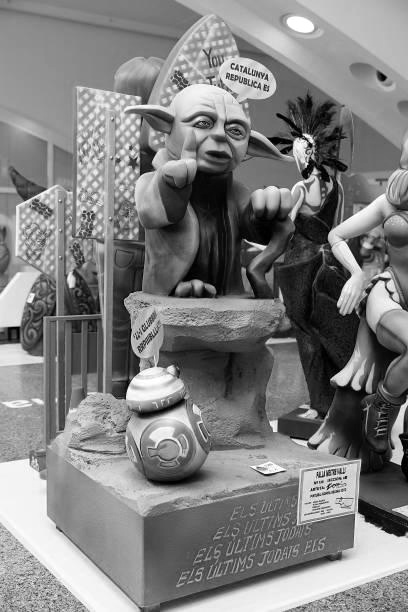

In [12]:
Image.fromarray(not_colorful)

Agora, utilizando a biblioteca OpenCV:

In [13]:
gray = cv2.cvtColor(colorful, cv2.COLOR_BGR2GRAY)

In [14]:
gray

array([[125, 122, 121, ..., 154, 153, 153],
       [127, 125, 123, ..., 154, 153, 153],
       [128, 126, 125, ..., 155, 154, 154],
       ...,
       [130, 129, 169, ...,  95, 136, 145],
       [126, 134, 156, ...,  98, 140, 141],
       [140, 146, 137, ...,  97, 129,  88]], dtype=uint8)

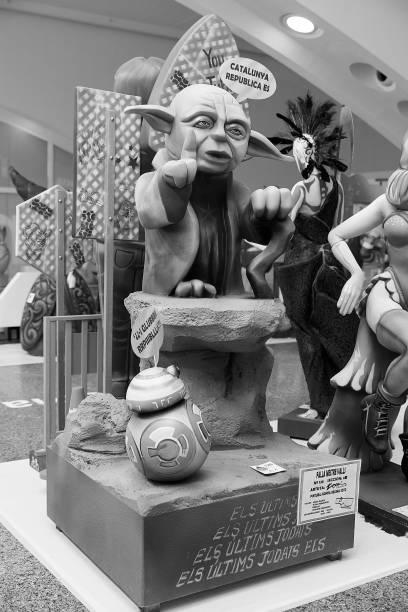

In [15]:
Image.fromarray(gray)

Também é possível notar que o tamanho das matrizes se mantém! O que faz sentido, pois a imagem não altera seu tamanho. Entretanto, observe abaixo que no caso da imagem em tons de cinza, existe somente uma matriz, como no caso da imagem chamada "gray". Isso não ocorre na imagem "not_colorful" ao chamar a função shape, pois para visualizá-la acima foi utilizado a biblioteca OpenCV, isto é, ainda que a imagem esteja em tons de cinza, ela está em BGR devido ao uso dessa biblioteca, possuindo, portanto, 3 matrizes.

OBS.: o número 3 visto abaixo corresponde ao número de matrizes (3 matrizes: azul, verde e vermelho)

In [16]:
colorful.shape

(612, 408, 3)

In [17]:
not_colorful.shape

(612, 408, 3)

In [18]:
gray.shape

(612, 408)

Com OpenCV, também é possível alterar o espaço de cores, ou seja, de BGR para Gray ou para HSV, entre outros! Existem mais de 150 conversões de "colorspaces". 

Uma dessas conversões já foi utilizada anteriormente: para transformar a imagem colorida do Yoda em uma "preto e branco" (tons de cinza). Para isso, foi utilizado o seguinte código: "cv2.cvtColor(colorful, cv2.COLOR_BGR2GRAY)". 

Esse código faz a conversão de BGR para Gray!

Uma outra conversão é de BGR para HSV: 

In [19]:
hsv = cv2.cvtColor(colorful, cv2.COLOR_BGR2HSV)

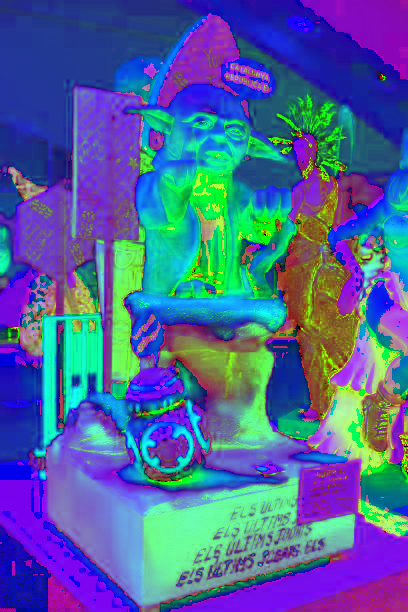

In [20]:
Image.fromarray(hsv)

Com HSV também é possível verificar o tamanho de suas matrizes: 

In [21]:
hsv.shape

(612, 408, 3)

Além disso, com o comando abaixo pode-se obter algumas outras conversões de "colorspaces"! 

In [22]:
flags = [i for i in dir(cv2) if i.startswith('COLOR_')]
print( flags )

['COLOR_BAYER_BG2BGR', 'COLOR_BAYER_BG2BGRA', 'COLOR_BAYER_BG2BGR_EA', 'COLOR_BAYER_BG2BGR_VNG', 'COLOR_BAYER_BG2GRAY', 'COLOR_BAYER_BG2RGB', 'COLOR_BAYER_BG2RGBA', 'COLOR_BAYER_BG2RGB_EA', 'COLOR_BAYER_BG2RGB_VNG', 'COLOR_BAYER_BGGR2BGR', 'COLOR_BAYER_BGGR2BGRA', 'COLOR_BAYER_BGGR2BGR_EA', 'COLOR_BAYER_BGGR2BGR_VNG', 'COLOR_BAYER_BGGR2GRAY', 'COLOR_BAYER_BGGR2RGB', 'COLOR_BAYER_BGGR2RGBA', 'COLOR_BAYER_BGGR2RGB_EA', 'COLOR_BAYER_BGGR2RGB_VNG', 'COLOR_BAYER_GB2BGR', 'COLOR_BAYER_GB2BGRA', 'COLOR_BAYER_GB2BGR_EA', 'COLOR_BAYER_GB2BGR_VNG', 'COLOR_BAYER_GB2GRAY', 'COLOR_BAYER_GB2RGB', 'COLOR_BAYER_GB2RGBA', 'COLOR_BAYER_GB2RGB_EA', 'COLOR_BAYER_GB2RGB_VNG', 'COLOR_BAYER_GBRG2BGR', 'COLOR_BAYER_GBRG2BGRA', 'COLOR_BAYER_GBRG2BGR_EA', 'COLOR_BAYER_GBRG2BGR_VNG', 'COLOR_BAYER_GBRG2GRAY', 'COLOR_BAYER_GBRG2RGB', 'COLOR_BAYER_GBRG2RGBA', 'COLOR_BAYER_GBRG2RGB_EA', 'COLOR_BAYER_GBRG2RGB_VNG', 'COLOR_BAYER_GR2BGR', 'COLOR_BAYER_GR2BGRA', 'COLOR_BAYER_GR2BGR_EA', 'COLOR_BAYER_GR2BGR_VNG', 'COLOR_

Uma curiosidade sobre HSV é que ela é boa para extrair objetos de uma determinada cor. Por exemplo, a cor azul: 

In [23]:
# Define o "range" da cor azul em HSV
lower_blue = np.array([110,50,50])
upper_blue = np.array([130,255,255])
# Valores de corte para a imagem em HSV e pegar somente as cores azuis
mask = cv2.inRange(hsv, lower_blue, upper_blue)
# Bitwise-AND mask 
res = cv2.bitwise_and(hsv,hsv, mask= mask)

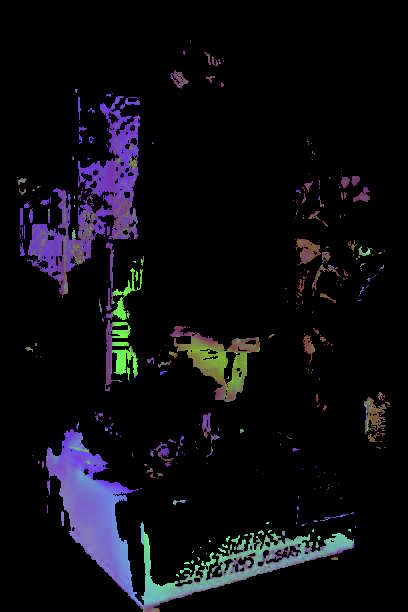

In [24]:
Image.fromarray(res)

Assim, a parte colorida da imagem acima são os "objetos" que possuem a cor azul! Entretanto, se for comparada com a imagem que foi mostrada no notebook, há partes que foram identificadas como azul, mas que na imagem não parece ser! Isso se deve ao fato de que a imagem mostrada está no espaço de cor BGR e não RGB, pois a biblioteca OpenCV trabalha com BGR, assim como foi dito anteriormente.

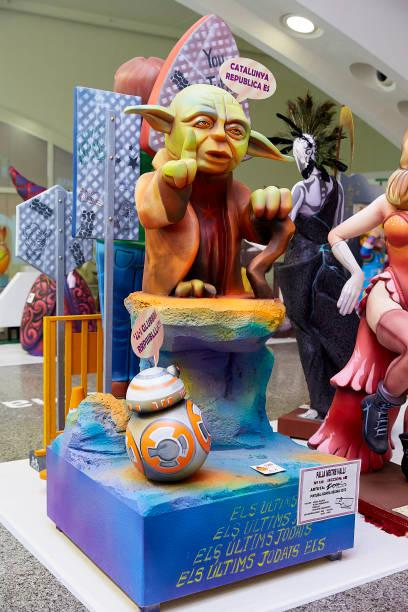

In [25]:
rgb = cv2.cvtColor(colorful, cv2.COLOR_BGR2RGB)
Image.fromarray(rgb)

Transformando a imagem em RGB, agora podemos observar o Yoda com a cara verde novamente! E comparando as cores, consegue-se identificar a cor azul assim como foi feito anteriormente! 

### Tarefa 3 - Augmentation

A técnica de Augmentation é utilizada para fazer algumas modificações em imagens já existentes no dataset para criar novas imagens e aumentar o tamanho da dataset de forma que diminua o overfitting. Algumas dessas modificações serão feitas abaixo:

Para essas alterações será utilizada a seguinte imagem: 

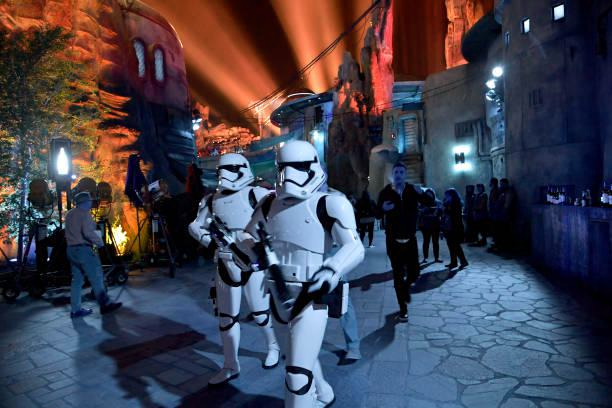

In [26]:
stormtrooper = cv2.imread("Imagens/StormtrooperAugmentation.jpg")
Image.fromarray(stormtrooper)

A primeira transformação será "flip", isto é, inverter a imagem. Iremos inverter horizontalmente e verticalmente pelos métodos da biblioteca Numpy! 

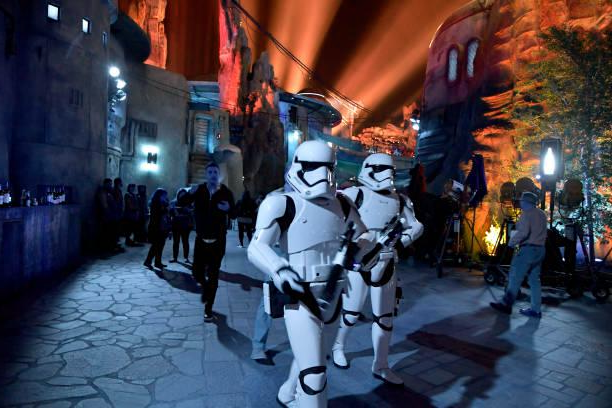

In [27]:
horizontal_flip = np.fliplr(stormtrooper)
Image.fromarray(horizontal_flip)

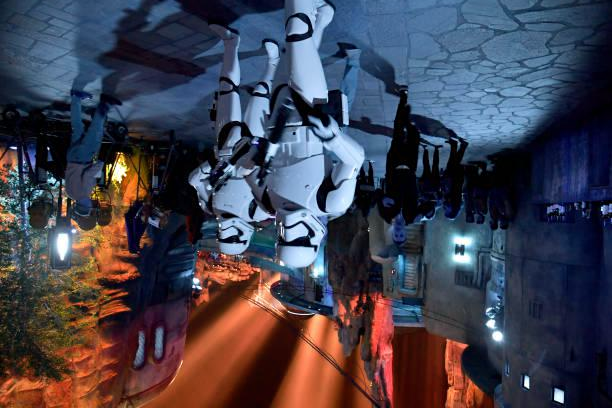

In [28]:
vertical_flip = np.flipud(stormtrooper)
Image.fromarray(vertical_flip)

A segunda alteração será rotação! Para isso, foi necessário utilizar skimage, uma biblioteca do Python que trabalha com "numpy arrays".

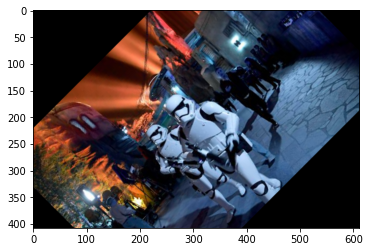

In [29]:
import skimage
# Função
rotated_img = skimage.transform.rotate(image = stormtrooper, angle = 45)
# Visualização
plt.imshow(rotated_img)
plt.show()

Utilizando um valor negativo no "angle" temos uma rotação no sentido horário:

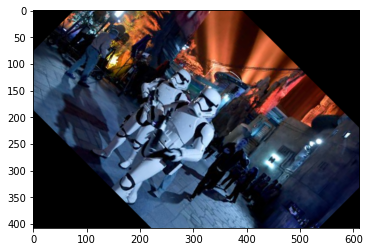

In [30]:
import skimage
# Função
rotated_img2 = skimage.transform.rotate(image = stormtrooper, angle = -45)
# Visualização
plt.imshow(rotated_img2)
plt.show()

Com skimage também é possível alterar o brilho da imagem: 

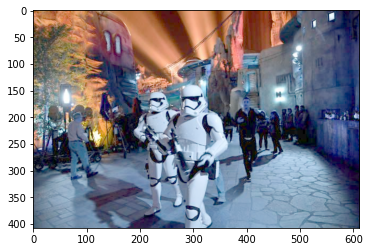

In [31]:
# Função
image_bright = skimage.exposure.adjust_gamma(stormtrooper, gamma=0.5,gain=1)
# Visualização
plt.imshow(image_bright)
plt.show()

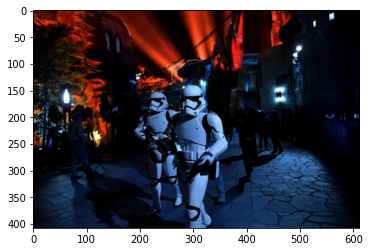

In [32]:
# Função
image_dark = skimage.exposure.adjust_gamma(stormtrooper, gamma = 2, gain = 1)
# Visualização
plt.imshow(image_dark)
plt.show()

Com os códigos acima é possível perceber que quanto maior o número colocado em gamma, mais "escuro" a imagem fica. Além disso, esse valor deve ser positivo! 

#### Utilizando algumas libs: 

Utilizando OpenCV, pode-se inverter as imagens: 

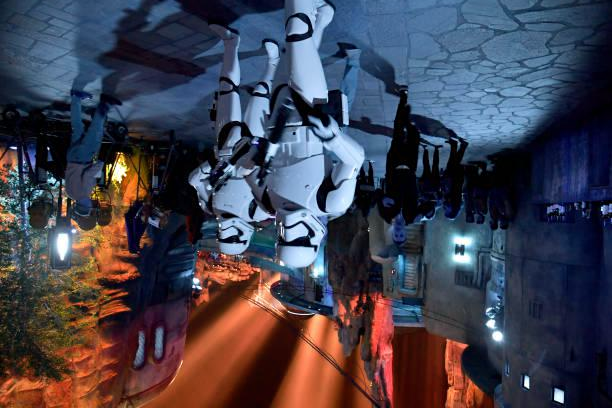

In [33]:
cv_flip_vert = cv2.flip(stormtrooper, 0)
Image.fromarray(cv_flip_vert)

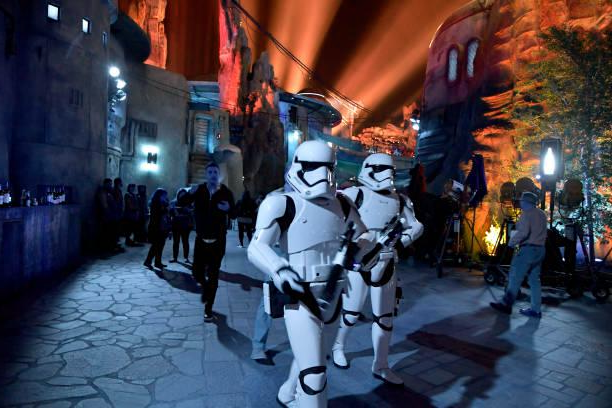

In [34]:
cv_flip_hor = cv2.flip(stormtrooper, 1)
Image.fromarray(cv_flip_hor)

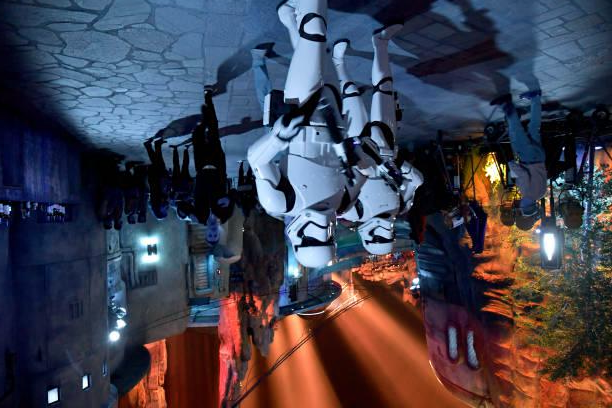

In [35]:
cv_flip_all = cv2.flip(stormtrooper, -1)
Image.fromarray(cv_flip_all)

Utilizando TensorFlor - Keras, pode-se rotacionar aleatoriamente:

In [36]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator

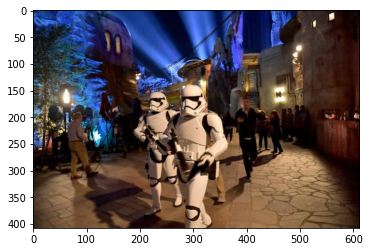

In [37]:
# Carrega a imagem
stormtrooper = load_img("Imagens/StormtrooperAugmentation.jpg")
plt.imshow(stormtrooper)
plt.show()
# Transfoma em array
stormtrooper = img_to_array(stormtrooper)
# Cria uma dimensão extra no array (se não for criada, gera um erro)
stormtrooper = np.expand_dims(stormtrooper, axis = 0)

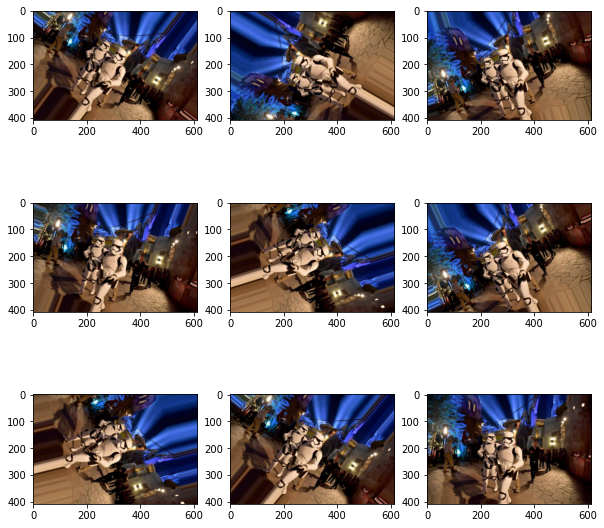

In [38]:
# cria um gerador (generator) com as imagens dadas
imgAug = ImageDataGenerator(rotation_range= 90, fill_mode = 'nearest')
iterator = imgAug.flow(stormtrooper, batch_size=1)
# gerar 10 imagens e visualizar
plt.figure(figsize=(10,10))
for i in range(9): 
	plt.subplot(330 + 1 + i)
	# gera imagens para cada batch
	batch = iterator.next()
	# conversão de volta para valores int para visualizar
	new_image = batch[0].astype('uint8')
	# plotagem
	plt.imshow(new_image)
plt.show()

Com TensorFlow também é possível dar um zoom aleatório na imagem: 

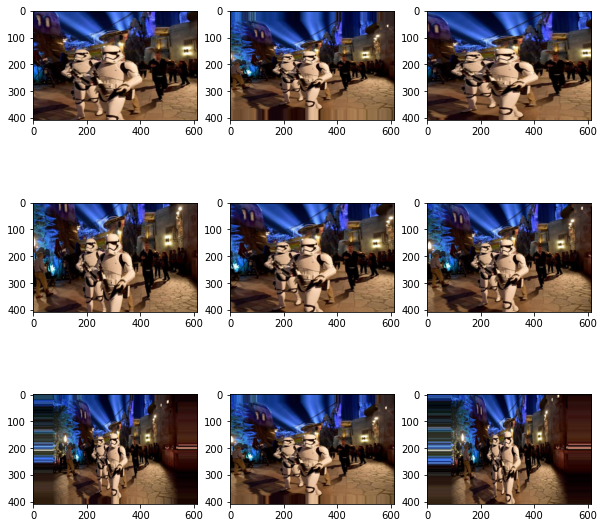

In [39]:
imgAug = ImageDataGenerator(zoom_range = 0.50, fill_mode = 'nearest')
iterator = imgAug.flow(stormtrooper, batch_size=1)
# gerar 10 imagens por data augmentation
plt.figure(figsize=(10,10))
for i in range(9): 
	plt.subplot(330 + 1 + i)
	# gera imagens para cada batch
	batch = iterator.next()
	# conversão de volta para valores int para visualizar
	new_image = batch[0].astype('uint8')
	# plotagem
	plt.imshow(new_image)
plt.show()

E adivinha? Também é possível alterar o brilho aleatoriamente: 

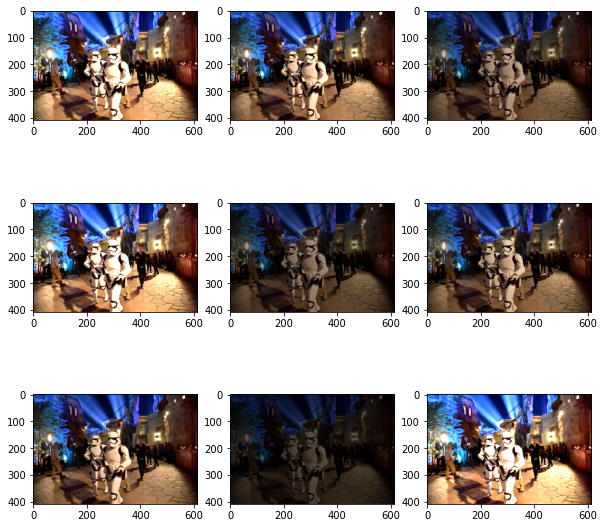

In [40]:
imgAug = ImageDataGenerator(brightness_range=[0.25,2], fill_mode = 'nearest')
iterator = imgAug.flow(stormtrooper, batch_size=1)
# gerar 10 imagens por data augmentation
plt.figure(figsize=(10,10))
for i in range(9): 
	plt.subplot(330 + 1 + i)
	# gera imagens para cada batch
	batch = iterator.next()
	# conversão de volta para valores int para visualizar
	new_image = batch[0].astype('uint8')
	# plotagem
	plt.imshow(new_image)
plt.show()

Agora, em vez de utilizar "ImageDataGenerator, iremos utilizar o "tf.image.stateless_random_[...]", em que o "[...]" pode ser alterado de acordo com a funcionalidade pedida. Nesse caso, será alterado o contraste aleatoriamente: 

In [41]:
import tensorflow as tf
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

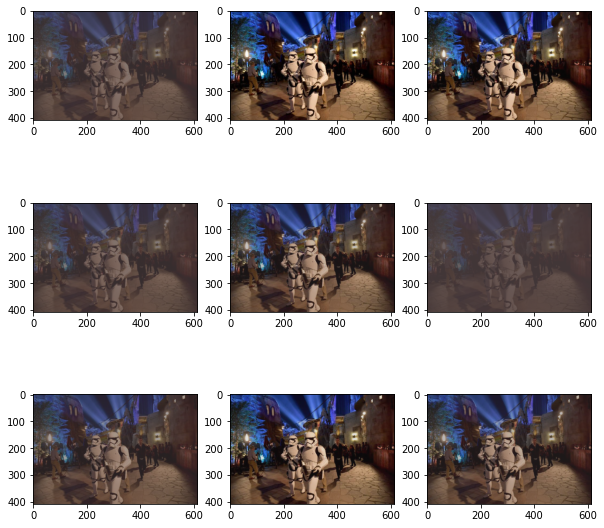

In [42]:
# gera 10 imagens com "constrast" aleatório
plt.figure(figsize=(10,10))
for i in range(9):
  plt.subplot(3, 3, i + 1)
  # para gerar números pseudoaleatórios
  seed = (i, 0)  
  # uso do método
  stateless_random_contrast = tf.image.stateless_random_contrast(stormtrooper, lower=0.1, upper=1.1, seed=seed)
  # deixa a imagem com o "shape" que conhecemos: [x, x, x]
  image = tf.squeeze(stateless_random_contrast)
  # visualiza a imagem
  plt.imshow(image.astype('uint8'))
plt.show()


Além disso tudo, também é possível fazer cortes da imagem de forma aleatória! Nesse caso, o tamanho da imagem final é definido pelo parâmetro "size", assim, o que irá mudar é o local onde é feito o recorte:

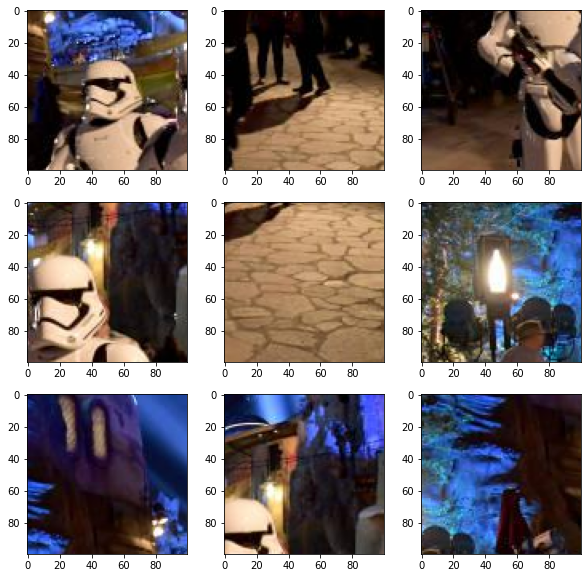

In [43]:
# gera 10 imagens com recorte aleatório
plt.figure(figsize=(10,10))
for i in range(9):
  plt.subplot(3, 3, i + 1)
  # para gerar números pseudoaleatórios
  seed = (i, 0)
  # uso do método
  stateless_random_crop = tf.image.stateless_random_crop(stormtrooper, size=[1, 100, 100, 3], seed=seed)
  # deixa a imagem com o "shape" que conhecemos: [x, x, x]
  image = tf.squeeze(stateless_random_crop)
  # visualiza a imagem
  plt.imshow(image.astype('uint8'))
plt.show()

Entretanto, o que é de fato interessante é criar uma imagem com todos esses fatores aleatórios. Um método já automático é o que utilizamos anteriormente: "ImageDataGenerator": 

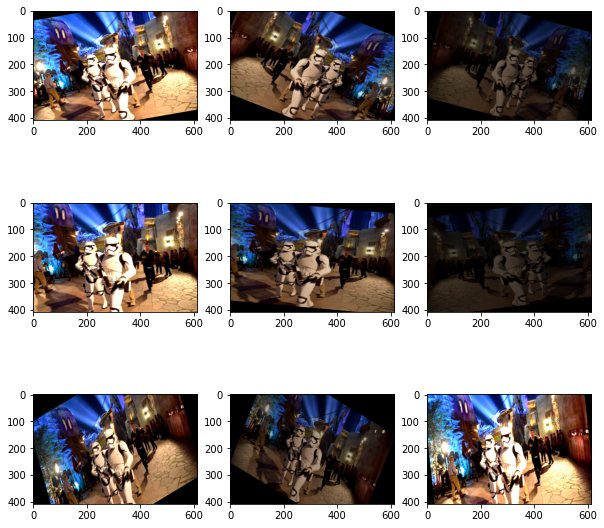

In [44]:
imgAug = ImageDataGenerator(rotation_range=30, brightness_range=[0.25,2], zoom_range=0.25,
    						fill_mode='constant', horizontal_flip=True,)
iterator = imgAug.flow(stormtrooper, batch_size=1)
# gerar 10 imagens por data augmentation
plt.figure(figsize=(10,10))
for i in range(9): 
	plt.subplot(330 + 1 + i)
	# gera imagens para cada batch
	batch = iterator.next()
	# conversão de volta para valores int para visualizar
	new_image = batch[0].astype('uint8')
	# plotagem
	plt.imshow(new_image)
plt.show()

E com esse código, pode-se adicionar mais funcionalidades que não são abordadas por esse método, como por exemplo, alterar o contraste: 

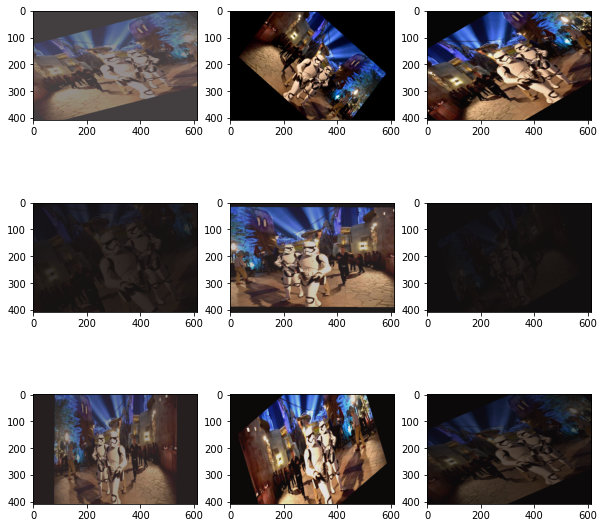

In [45]:
imgAug = ImageDataGenerator(rotation_range=45, brightness_range=[0.25,2], zoom_range=0.5,
							fill_mode='constant', horizontal_flip=True,)
iterator = imgAug.flow(stormtrooper, batch_size=1)
# gerar 10 imagens por data augmentation
plt.figure(figsize=(10,10))
for i in range(9): 
	plt.subplot(330 + 1 + i)
	# gera imagens para cada batch
	batch = iterator.next()
	# conversão de volta para valores int para visualizar
	new_image = batch[0].astype('uint8')
	# para gerar números pseudoaleatórios
	seed = (i, 0)
	stateless_random_contrast = tf.image.stateless_random_contrast(new_image, lower=0.1, upper=1.1, seed=seed)
	# deixa a imagem com o "shape" que conhecemos: [x, x, x]
	image = tf.squeeze(stateless_random_contrast)
	# plotagem
	plt.imshow(image)
plt.show()

### Tarefa 4 - Filtros

Para aplicar filtros na imagem, será utilizada a biblioteca OpenCV e a imagem abaixo:

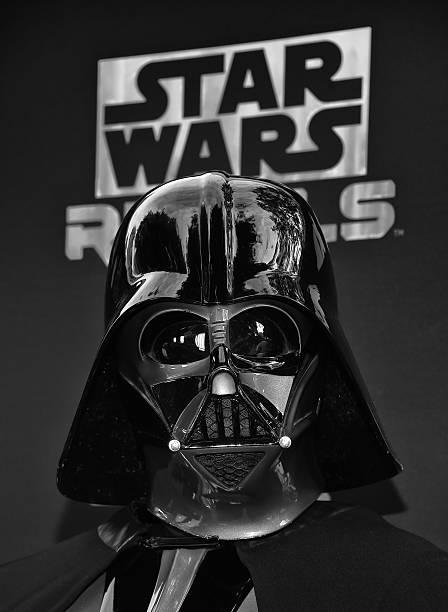

In [46]:
vader_filter = cv2.imread("Imagens/DarthVaderFilter.jpg")
Image.fromarray(vader_filter)

Antes de começar a mostrar alguns filtros do tipo "blur", é importante ressaltar que eles são feitos por meio da convolução com um kernel de filtro-passa-baixa e são muito importantes para remover "noise", além de que alguns filtros também suavizam as bordas da imagens.

#### 1. Blur (Averaging)

Filtro que funciona ao fazer a média de todos os pixels sob a área de kernel e substituir o valor no elemento central. 

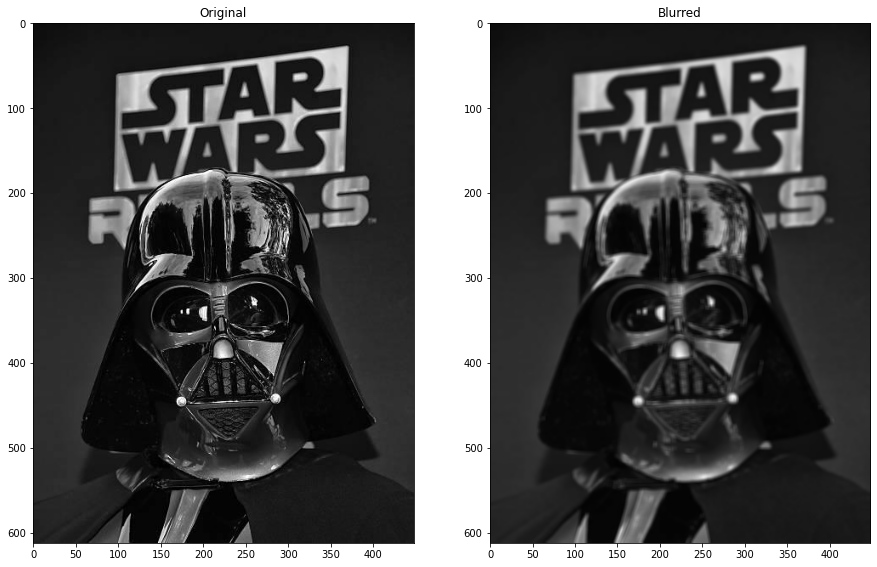

In [47]:
# Kernel com 5x5 de tamanho
blur = cv2.blur(vader_filter,(5,5))
# Visualização das imagens (antes/depois)
plt.figure(figsize=(15,15))
# Antes
plt.subplot(1,2,1)
plt.imshow(vader_filter)
plt.title('Original')
# Depois
plt.subplot(1,2,2)
plt.imshow(blur)
plt.title('Blurred')

plt.show()

#### 2. Gaussian Blur

Esse filtro é parecido com o anterior, porém, em vez de calcular uma média aritmética, é calculado a média ponderada.

Nesse caso, também é necessário fornecer os valores de largura e altura do kernel, que devem ser positivos e ímpares. Além disso, também é preciso especificar os desvios padrão nos eixos X e Y. No exemplo será usado o valor 0 para ambos, dessa forma, eles serão calculados pelo tamanho do kernel.

Também é importante notar que esse filtro, em comparação com o anterior, consegue manter melhor as bordas da imagem. 

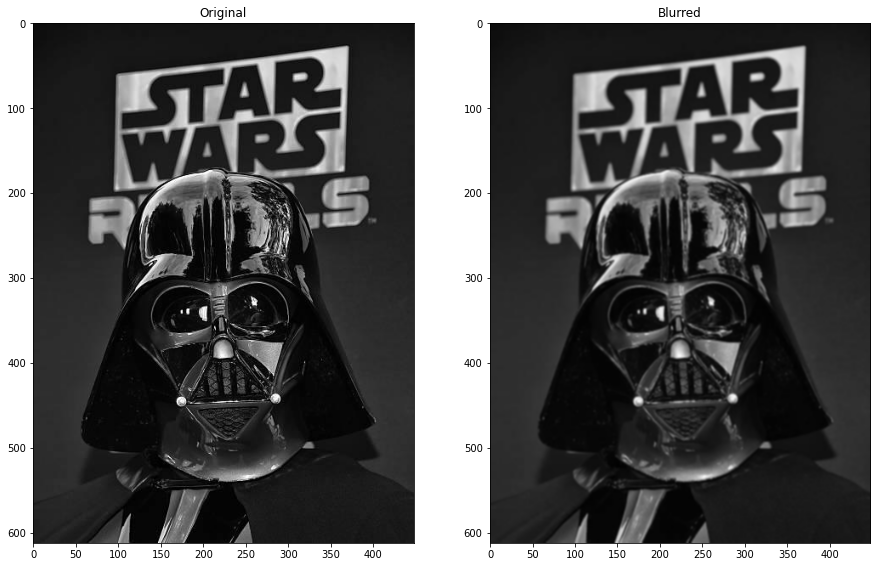

In [48]:
# Kernel com 5x5 de tamanho e 0 para os desvios padrão
gaussian_blur = cv2.GaussianBlur(vader_filter,(5,5),0)

# Visualização das imagens (antes/depois)
plt.figure(figsize=(15,15))
# Antes
plt.subplot(1,2,1)
plt.imshow(vader_filter)
plt.title('Original')
# Depois
plt.subplot(1,2,2)
plt.imshow(gaussian_blur)
plt.title('Blurred')

plt.show()

#### 3. Median Blur

Esse filtro, por sua vez, calcula a mediana de todos os pixels na área do kernel e substitui esse valor no elemento central. 

Nesse caso, o tamanho do kernel deve ser positivo e ímpar. Além disso, esse filtro é muito bom para diminuir o "noise", como o "salt-and-pepper", e consegue manter as bordas da imagem.

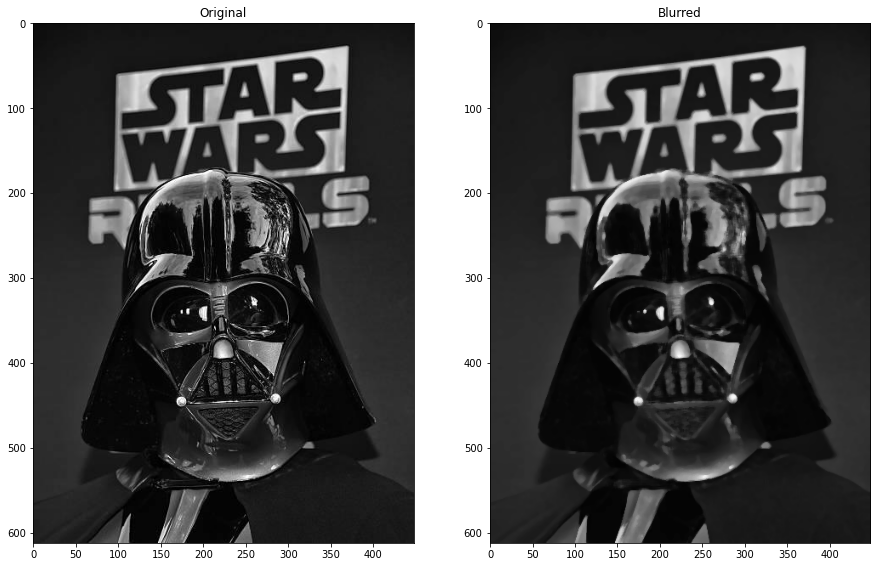

In [49]:
# Kernel com 5x5 de tamanho 
median_blur = cv2.medianBlur(vader_filter,5)

# Visualização das imagens (antes/depois)
plt.figure(figsize=(15,15))
# Antes
plt.subplot(1,2,1)
plt.imshow(vader_filter)
plt.title('Original')
# Depois
plt.subplot(1,2,2)
plt.imshow(median_blur)
plt.title('Blurred')

plt.show()

Agora, para entender um pouco mais sobre esses filtros, vamos criar um filtro mais "personalizado", isto é, criando um kernel de nossa escolha. 

Primeiro, iremos definir o kernel. Lembrando que o valor da variável "kernel_size" deve ser um número ímpar entre 3 e 11, de maneira geral, ela irá definir o tamanho da matriz, por exemplo: 

In [50]:
kernel_size = 3
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32)
kernel = kernel / (kernel_size * kernel_size)
print(kernel)

[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


In [51]:
kernel_size = 5
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32)
kernel = kernel / (kernel_size * kernel_size)
print(kernel)

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


Prosseguindo na criação do nosso filtro "personalizado", iremos escolher um kernel de tamanho 11. 

In [52]:
kernel_size = 11
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32)
kernel = kernel / (kernel_size * kernel_size)

Como cada posição da matriz se trata de um pixel, quanto maior o tamanho da matriz, mais pixels iremos utilizar para calcular o valor que iremos substituir, dessa forma, teremos um efeito de "blur" maior. Mas para verificar tal afirmação: 

Vamos aplicar o filtro por meio da função abaixo:

In [53]:
filter_personalized = cv2.filter2D(vader_filter, -1, kernel)

E finalmente, visualizar as imagens! 

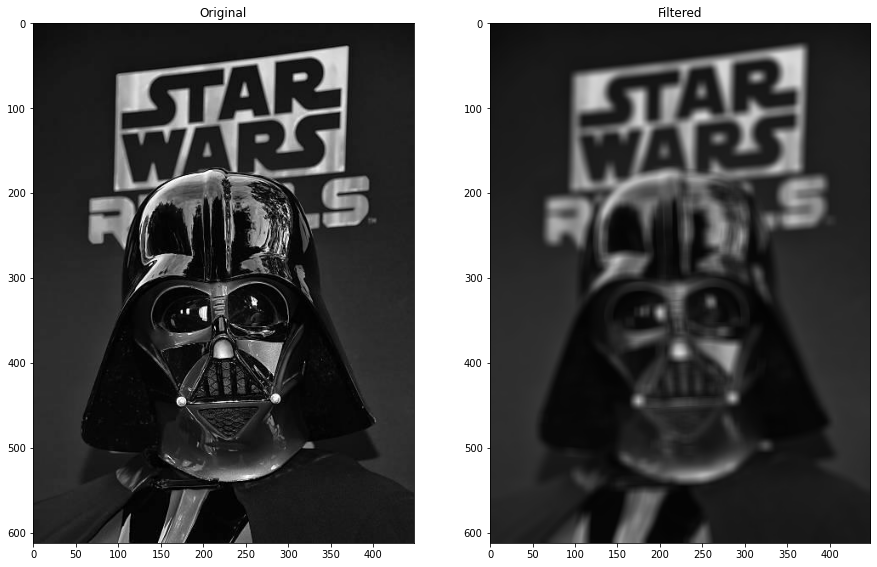

In [54]:
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(vader_filter)
plt.title('Original')
plt.subplot(1,2,2)
plt.imshow(filter_personalized)
plt.title('Filtered')
plt.show()

Percebe-se que a imagem que passou pelo filtro realmente ficou mais embaçada que as outras que fizemos anteriormente! 